In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

# git clone repo

In [0]:
cd /content/gdrive/My\ Drive/Colab\ Notebooks
# after git clone
#cd session3

# one more git clone for test db

# Plan


---



1.   Overview: Stereo Matching
2.   Getting familiar with datasets
3.   Learning to implement a complete model in Keras!
4.   Train and Test model
5.   Performing Network Surgery!



# Stereo Disparity Estimation


---



Depth estimation is an important task in various computer vision applications. A cost effecive approach for depth estimation is to employ a stereo camera setup, in which two cameras separated by a distance (baseline) capture two *shifted* views of a scene. The amount of shift of a pixel corresponding to a 3D world point is inversely proportional to the distance of the world point from the camera plane.

> 

Human is a common example of a stereoscopic vision system! Observe the lateral shift of a 3D world point by closing your one eye. Follow this link to get a better understanding of the problem and concepts: http://www.cs.tut.fi/~suominen/SGN-1656-stereo/stereo_instructions.pdf

>

Let's look at an example stereo image pair (**rectified**) from the popular **Middlebury** dataset!

In [0]:
from IPython.display import Image, display

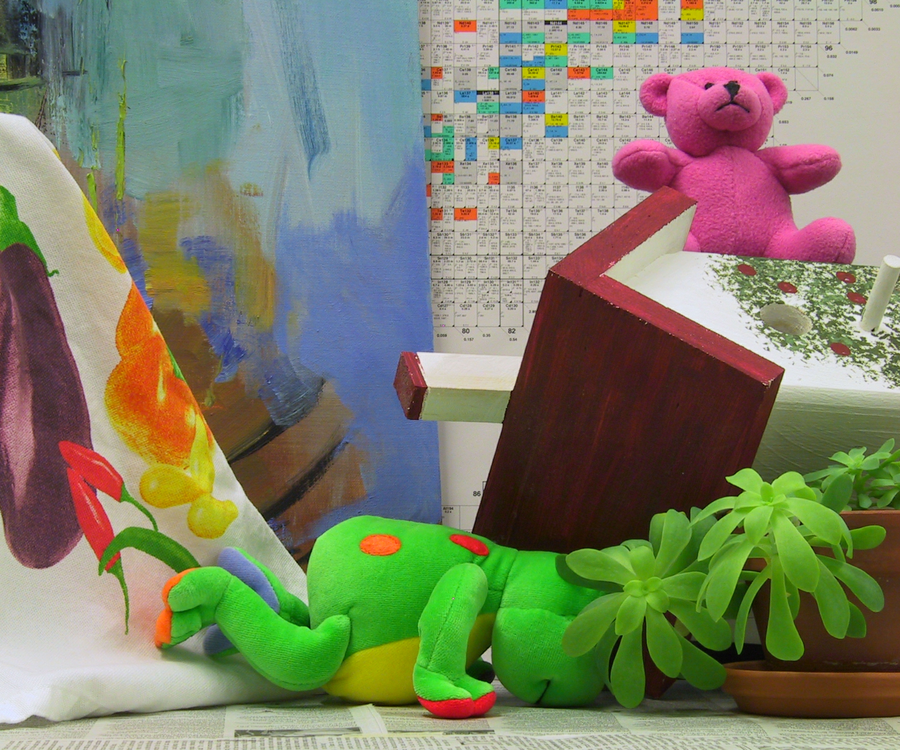

In [8]:
# left image
display(Image("images/disp_overview_left.png", height=256, width=384))

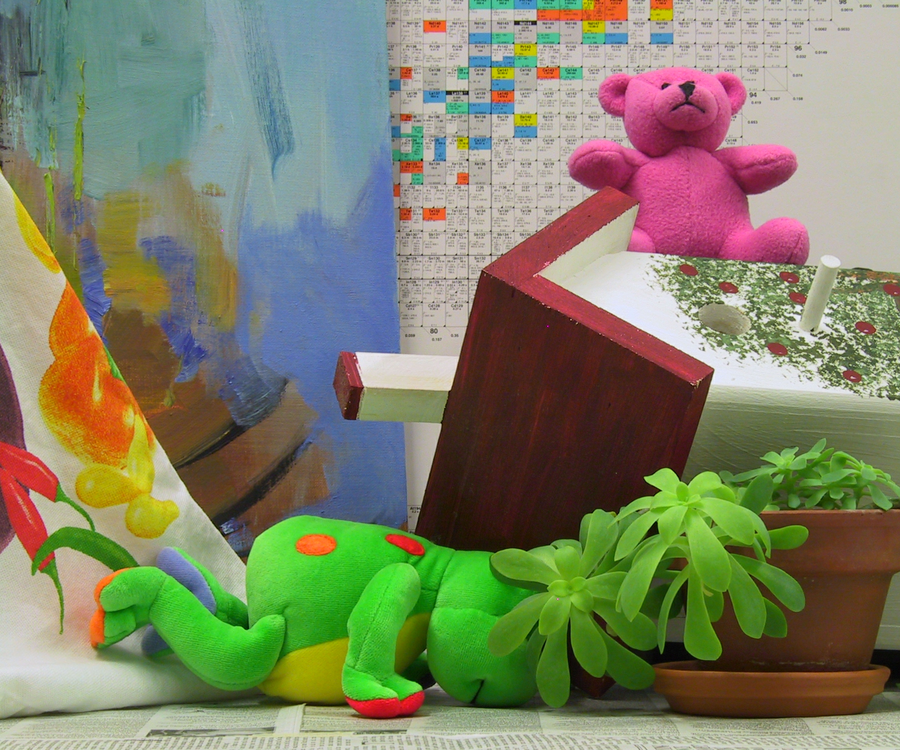

In [9]:
# right image
display(Image("images/disp_overview_right.png", height=256, width=384))

## Disparity estimation involves correspondence matching!

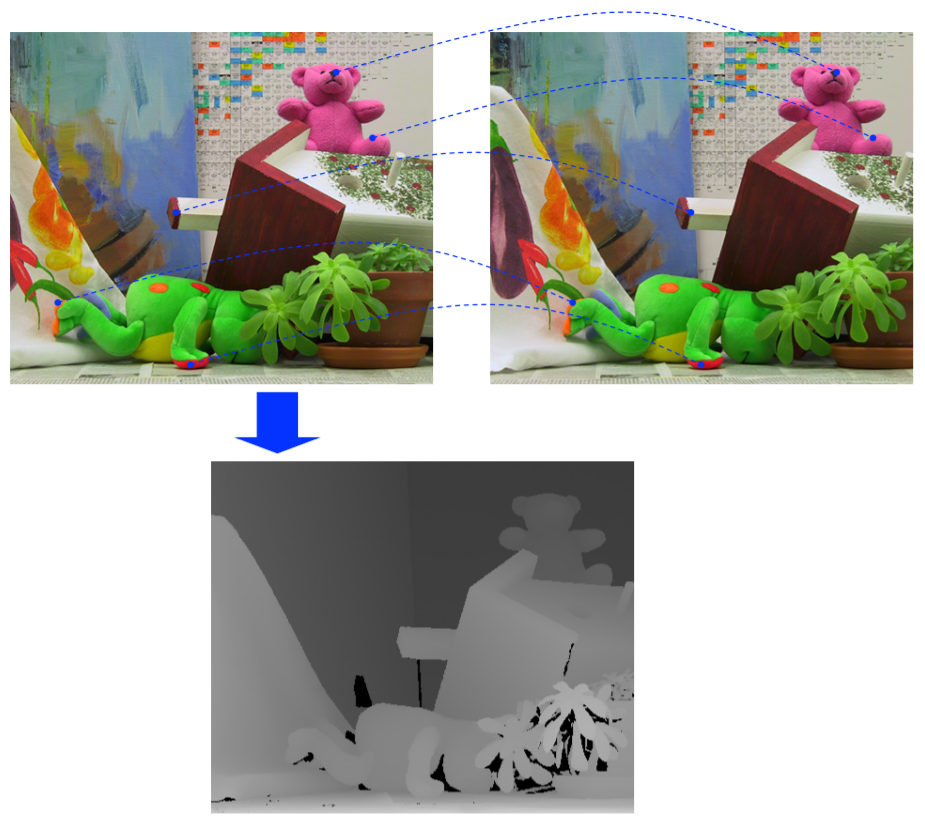

In [10]:
display(Image("images/correspondence_matching.PNG", height=512, width=686))

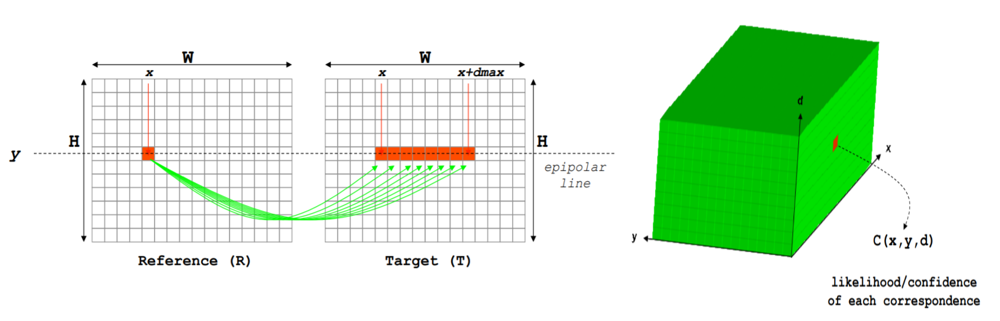

In [11]:
display(Image("images/cost_compute_volume.png", height=384, width=1240))

# Stereo Matching Deep Learning

Training a deep learning model requires a sufficiently large dataset. As the only main dataset available before 2015 was Middlebury (few tens of images), the first deep learning method [1] was aimed at computing the cost volume using a CNN. The network used a Siamese network architecture to compute similarity between two image patches; the similarity score was used as matching cost.


>

[1] Žbontar and Lecun, Stereo Matching by Training a Convolutional Neural Network to Compare Image Patches. JMLR (2016)

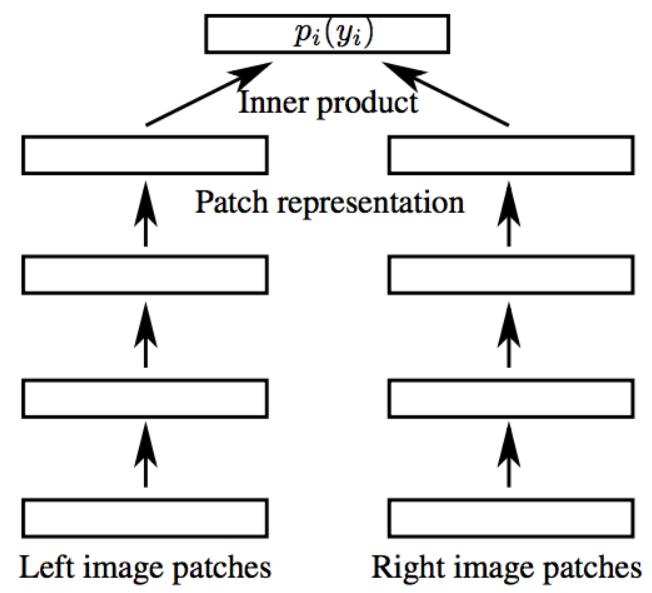

In [12]:
display(Image('images/siamese_nw.PNG', height=512, width=464))

## First End-to-End Network
In CVPR 2015, Mayer et al. [2] first introduced a large synthetic dataset, Scene Flow, containing stereo images with dense optical flow and disparity ground-truths! This also enabled them to attempt first-ever end-to-end disparity estimation method using CNNs.



>

[1] Mayer et al., A Large Dataset to Train Convolutional Networks for Disparity, Optical Flow, and Scene Flow Estimation. CVPR (2015)

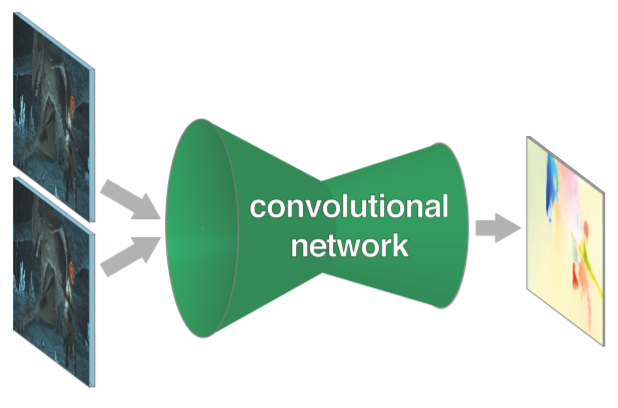

In [0]:
display(Image('images/flownet_overview.PNG', height=256, width=512))

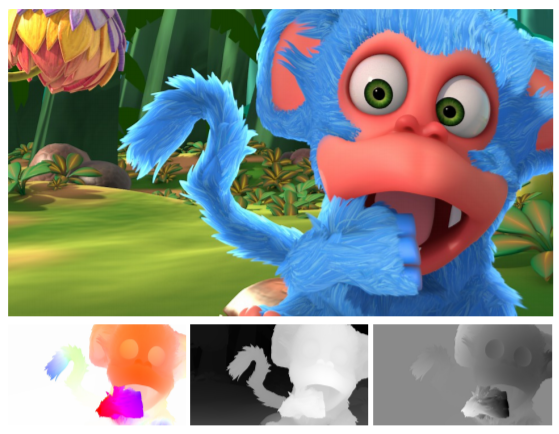

In [15]:
display(Image('images/scene_flow_teaser.PNG', height=384, width=512))

After Mayer et al.'s work, several other use case specific datasets. We summarize all the datasets below:

1.   Scene Flow: https://lmb.informatik.uni-freiburg.de/resources/datasets/SceneFlowDatasets.en.html
2.   KITTI 2015: http://www.cvlibs.net/datasets/kitti/eval_scene_flow.php?benchmark=stereo
3.   Middlebury: http://vision.middlebury.edu/stereo
4.   ETH3D: https://www.eth3d.net/low_res_two_view



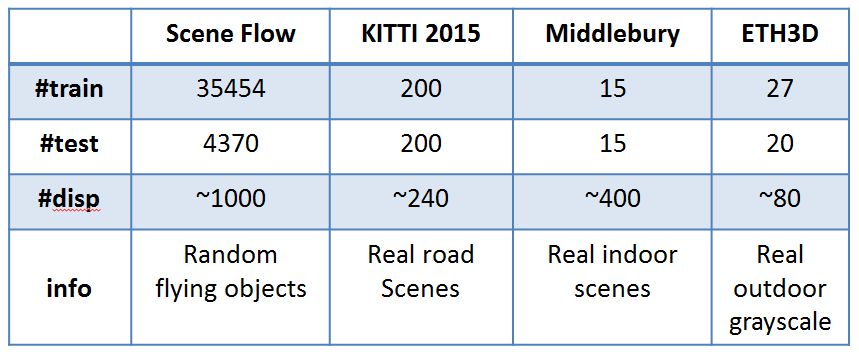

In [17]:
display(Image('images/datasets_overview/datasets_overview.PNG', height=256, width=648))

Let us explore some images in each of these datasets to get an idea of disparity with different stereo setup. 

**Scene Flow:**

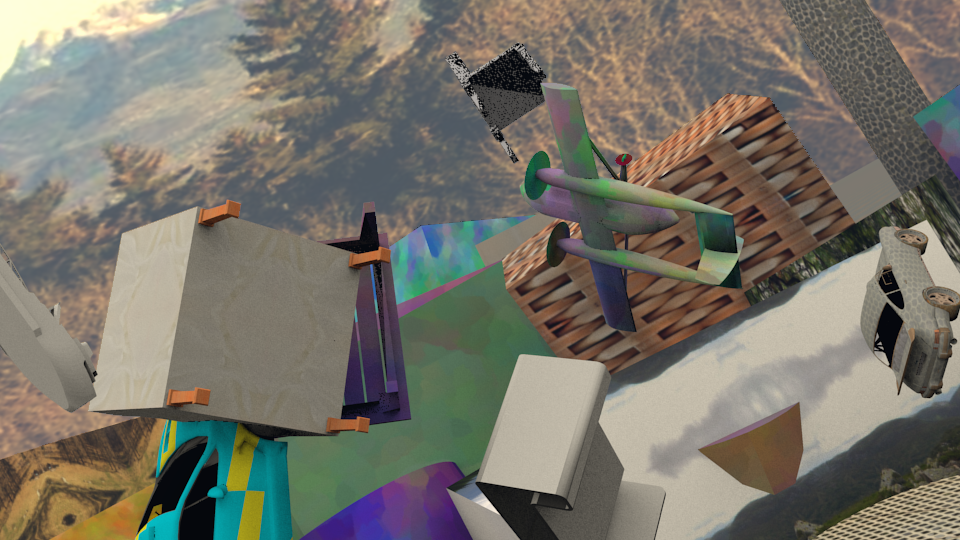

In [18]:
# left image
display(Image('images/datasets_overview/sceneflow_left.png', height=256, width=384))

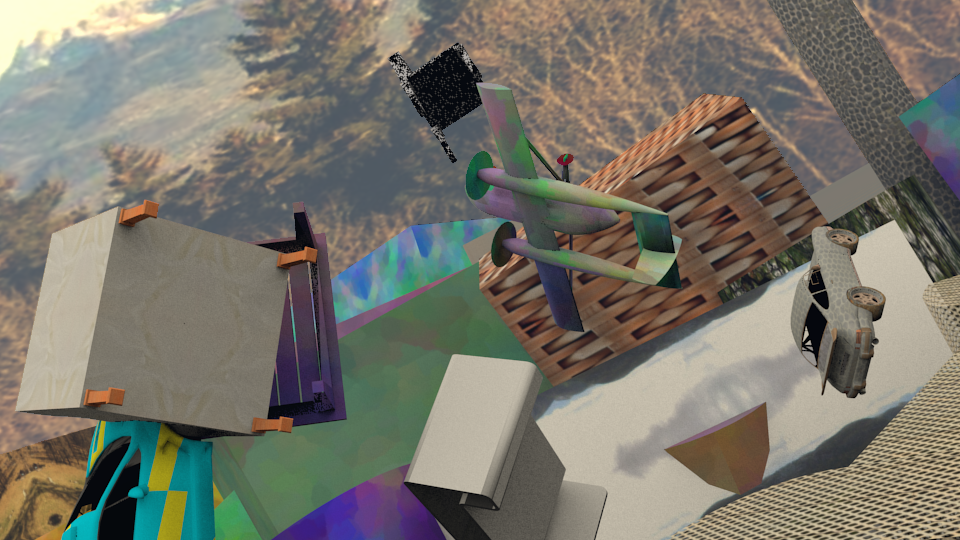

In [19]:
# right image
display(Image('images/datasets_overview/sceneflow_right.png', height=256, width=384))

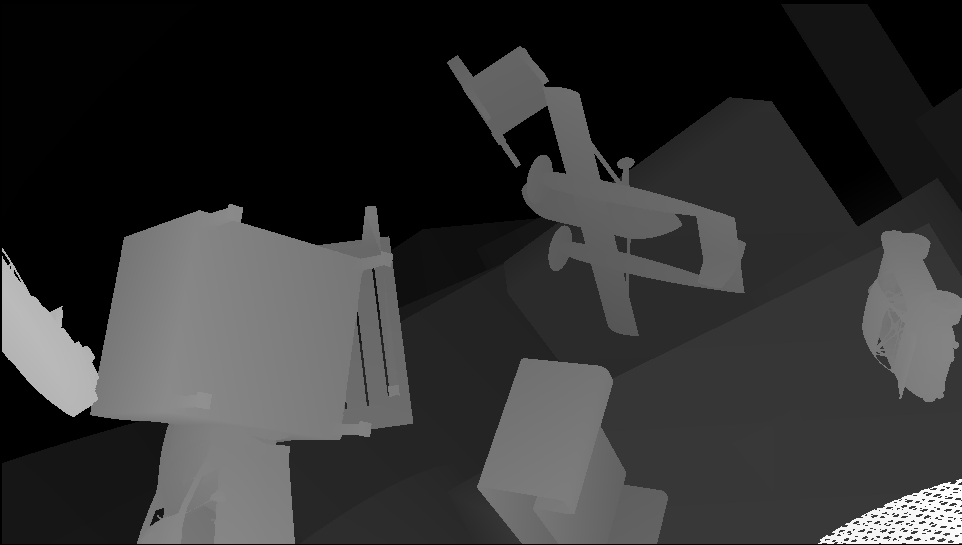

In [20]:
# disparity image
display(Image('images/datasets_overview/sceneflow_disp.PNG', height=256, width=384))

**KITTI 2015:**

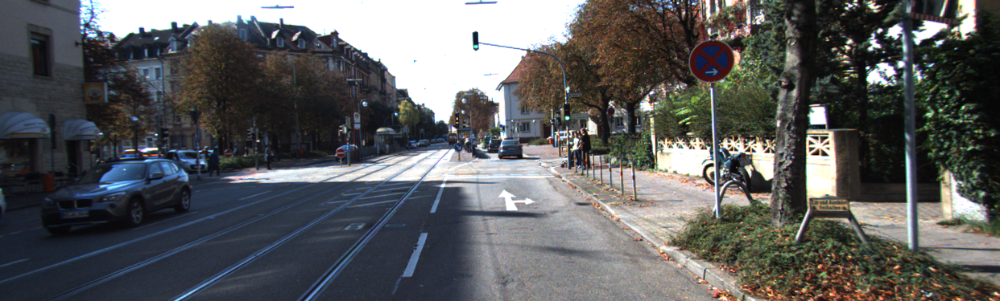

In [21]:
# left image
display(Image('images/datasets_overview/kitti_left.png', height=256, width=784))

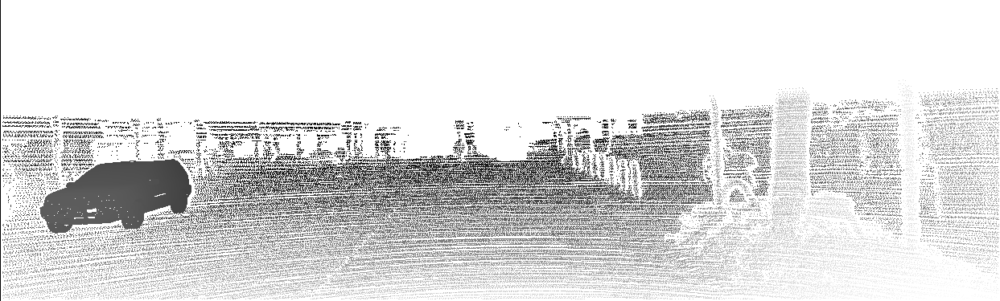

In [22]:
# disparity image
display(Image('images/datasets_overview/kitti_disp.PNG', height=256, width=784))

**ETH3D:**


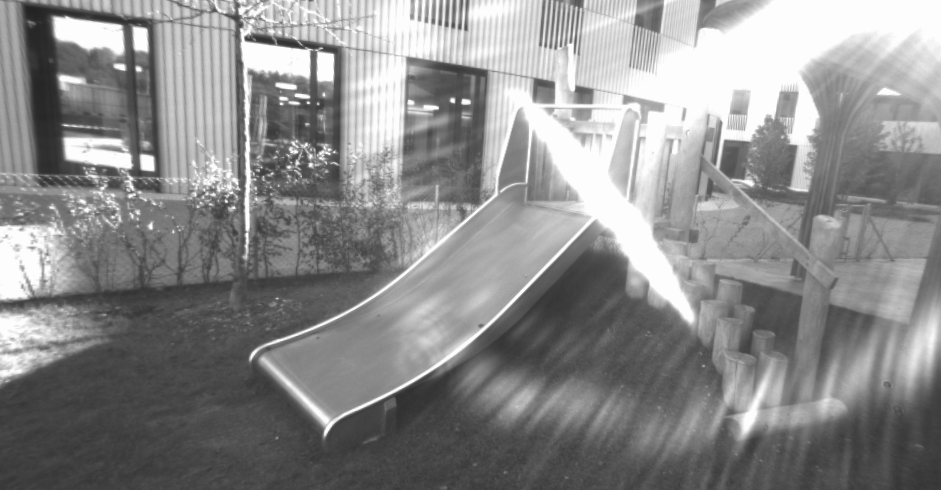

In [23]:
# left image
display(Image('images/datasets_overview/eth3d_left.png', height=256, width=384))

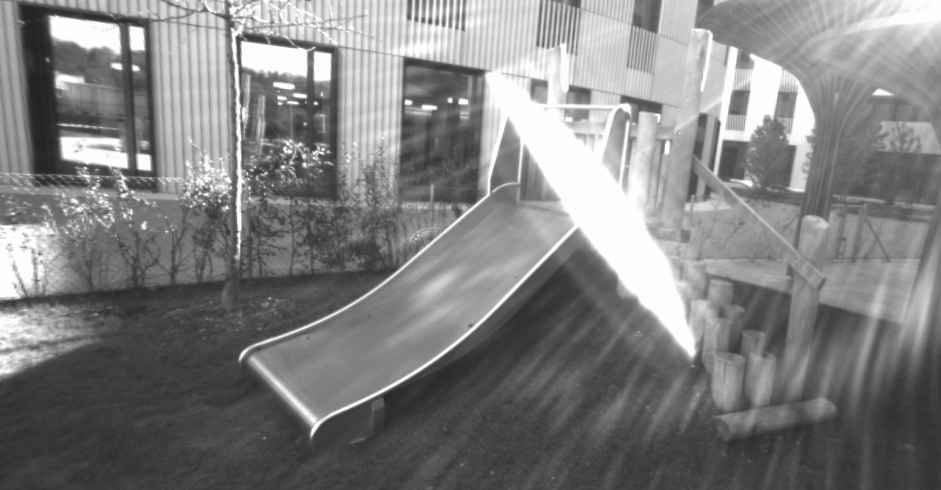

In [24]:
# right image
display(Image('images/datasets_overview/eth3d_right.png', height=256, width=384))

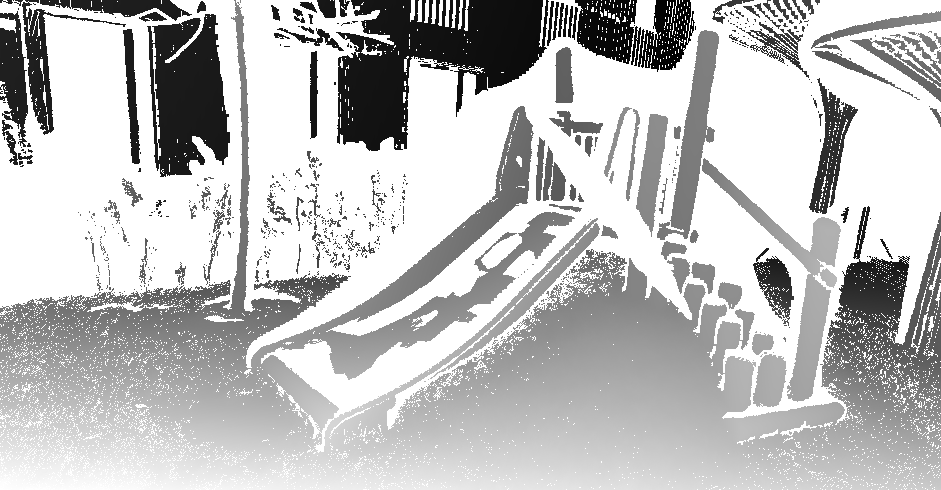

In [25]:
# disparity image
display(Image('images/datasets_overview/eth3d_disp.PNG', height=256, width=384))

# Keras Implementation:


1.   Dataloader routine
2.   Model definition
3.   Combining everything




# Building a Data Loader 

## Read images

PFM file format for disparity: http://www.pauldebevec.com/Research/HDR/PFM/

In [0]:
from skimage.io import imread
from python_pfm import *

In [28]:
left_image_path = "images/test_samples/sample_left1.png"
right_image_path = "images/test_samples/sample_right1.png"
disp_image_path = "images/test_samples/sample_disp1.pfm"
img_left = imread(left_image_path)
img_right = imread(right_image_path)
disp_left = readPFM(disp_image_path)

print(np.shape(img_left))
print(np.shape(img_right))
print(np.shape(disp_left))

(512, 960, 3)
(512, 960, 3)
(512, 960)


## We need a routine to randomly crop an input training sample

In [0]:
def crop_img(img, start_h ,start_w, new_h, new_w):
    return img[start_h:start_h+new_h, start_w:start_w+new_w]

In [33]:
height = img_left.shape[0]
width = img_left.shape[1]

print("Input height:", height)
print("Input width:", width)

Input height: 512
Input width: 960


## We train our model with a random crop of size 256 x 512 (H x W)

In [0]:
crop_height = 256
crop_width = 512

limit_h = height - crop_height
limit_w = width - crop_width
offset_h = np.random.randint(low=0, high=limit_h + 1)
offset_w = np.random.randint(low=0, high=limit_w + 1)

In [35]:
img_left = crop_img(img_left, offset_h, offset_w, crop_height, crop_width)
img_right = crop_img(img_right, offset_h, offset_w, crop_height, crop_width)
disp_left = crop_img(disp_left, offset_h, offset_w, crop_height, crop_width)

print(np.shape(img_left))
print(np.shape(img_right))
print(np.shape(disp_left))

(256, 512, 3)
(256, 512, 3)
(256, 512)


## Normalize input images, let's say in range -1 to 1

In [0]:
import numpy as np

img_left = (img_left/np.max(img_left)) * 2
img_right = (img_right/np.max(img_right)) * 2
img_left = img_left - 1
img_right = img_right - 1

## The input to the network is a concatenation of left and right images across channel axis

In [38]:
# concatenate left and right images
comb_img = np.dstack((img_left, img_right))
print(np.shape(comb_img))

(256, 512, 6)


## Finally, combine everything: Keras Data Generator
https://keras.io/utils/#sequence

Sequence
keras.utils.Sequence()
Base object for fitting to a sequence of data, such as a dataset.

Every Sequence must implement the __getitem__ and the __len__ methods. If you want to modify your dataset between epochs you may implement on_epoch_end. The method __getitem__ should return a complete batch.

In [39]:
from keras.utils import Sequence

Using TensorFlow backend.


In [0]:
class Dataloader(Sequence):
    def __init__(self, params, files_lists):
        self.mode = params.mode
        self.files_list = files_lists
        self.datapath = params.datapath
        self.batch_size = params.batch_size
        self.crop_height = params.crop_height
        self.crop_width = params.crop_width

        self.li_list, self.ri_list, self.ld_list = [] , [] , []

        count = 0
        with open(self.files_list) as f:
            for line in f:
                    count = count + 1
                    a = line.split()
                    self.li_list.append(a[0])
                    self.ri_list.append(a[1])
                    self.ld_list.append(a[2])
        # store numner of dataset samples
        self.length = count

    def __len__(self):
        # number of steps or iterations per epoch
        return self.length//self.batch_size

    def __getitem__(self,index):
            input_x, target_y = [], []
            for i in range(index * self.batch_size, min((index + 1) * self.batch_size, self.length)):
                img_left = imread(self.datapath + self.li_list[i])
                img_right = imread(self.datapath + self.ri_list[i])
                disp_left = readPFM(self.datapath + self.ld_list[i])

                height = img_left.shape[0]
                width = img_left.shape[1]

                if self.mode is not 'test':
                    limit_h = height - self.crop_height
                    limit_w = width - self.crop_width
                    offset_h = np.random.randint(low=0, high=limit_h + 1)
                    offset_w = np.random.randint(low=0, high=limit_w + 1)

                    img_left = crop_img(img_left, offset_h, offset_w, self.crop_height, self.crop_width)
                    img_right = crop_img(img_right, offset_h, offset_w, self.crop_height, self.crop_width)
                    disp_left = crop_img(disp_left, offset_h, offset_w, self.crop_height, self.crop_width)

                img_left = (img_left/np.max(img_left)) * 2
                img_right = (img_right/np.max(img_right)) * 2
                img_left = img_left - 1
                img_right = img_right - 1
                # concatenate left and right images
                comb_img = np.dstack((img_left, img_right))

                input_x.append(comb_img)
                target_y.append(np.expand_dims(disp_left, axis=2))
            return np.array(input_x), np.array(target_y)

## How to use the dataloader routine?

### fit generator

https://keras.io/models/model/#fit_generator

Trains the model on data generated batch-by-batch by a Python generator (or an instance of Sequence).

The generator is run in parallel to the model, for efficiency. For instance, this allows you to do real-time data augmentation on images on CPU in parallel to training your model on GPU.

The use of keras.utils.Sequence guarantees the ordering and guarantees the single use of every input per epoch when using use_multiprocessing=True.



In [0]:
train_list = ""
val_list = ""
test_list = ""

In [0]:
train_gen = Dataloader(params, train_list)
validation_gen = Dataloader(params, val_list)
test_gen = Dataloader(params, test_list)

# Second, Building the Model

Using functional API
https://keras.io/models/model/

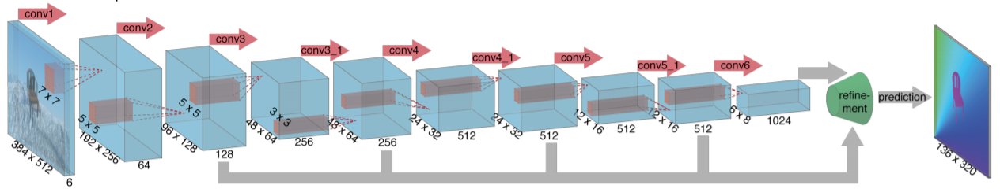

In [41]:
# DispNet encoder image
display(Image('images/dispnet_simple.PNG', height=384, width=1300))

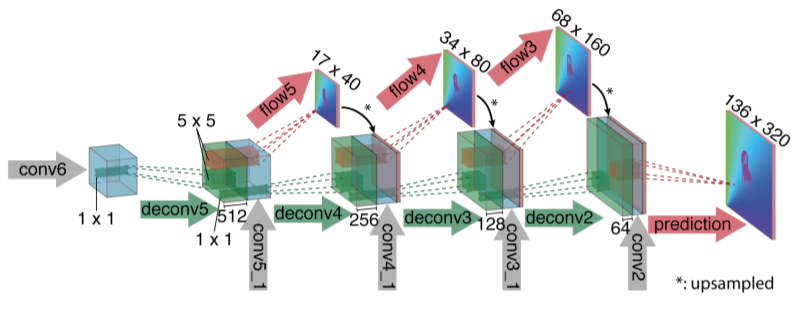

In [42]:
# DispNet decoder image
display(Image('images/dispnet_decoder.PNG', height=384, width=1124))

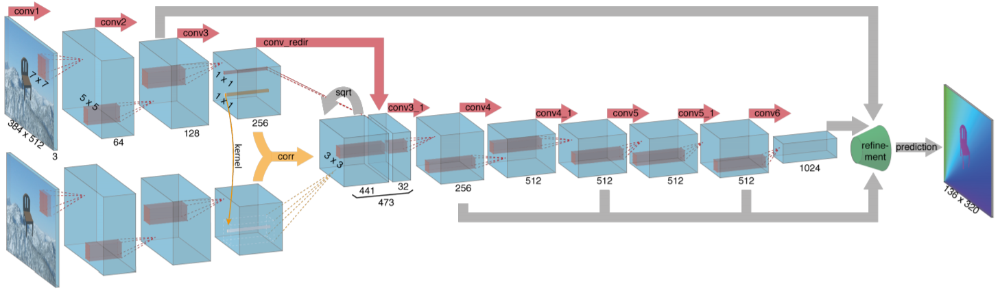

In [47]:
# DispNetC image
display(Image('images/dispnetc.PNG', height=384, width=1248))

## Required imports

In [0]:
import keras
from keras import backend as K
from keras.layers import Conv2D, Conv2DTranspose, UpSampling2D, Input, concatenate, AveragePooling2D, \
    BatchNormalization, Activation
from keras import regularizers, optimizers
from keras.models import Model

## Define the input shape

In [0]:
input = Input(shape=(crop_height, crop_width, 6,))

## Encoder

In [49]:
conv1_l = Conv2D(filters=64, kernel_size=7, strides=(2, 2), padding="same", activation='relu', use_bias=1,
                         kernel_initializer='random_normal', bias_initializer='zeros',
                         kernel_regularizer=regularizers.l2(0.0001))(input)
conv1_b = BatchNormalization()(conv1_l)
conv1 = Activation("relu")(conv1_b)

conv2_l = Conv2D(filters=128, kernel_size=5, strides=(2, 2), padding="same", activation='relu', use_bias=1,
                 kernel_initializer='random_normal', bias_initializer='zeros',
                 kernel_regularizer=regularizers.l2(0.0001))(conv1)
conv2_b = BatchNormalization()(conv2_l)
conv2 = Activation("relu")(conv2_b)

conv3a_l = Conv2D(filters=256, kernel_size=5, strides=(2, 2), padding="same", activation='relu', use_bias=1,
                  kernel_initializer='random_normal', bias_initializer='zeros',
                  kernel_regularizer=regularizers.l2(0.0001))(conv2)
conv3a_b = BatchNormalization()(conv3a_l)
conv3a = Activation("relu")(conv3a_b)

conv3b_l = Conv2D(filters=256, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                  kernel_initializer='random_normal', bias_initializer='zeros',
                  kernel_regularizer=regularizers.l2(0.0001))(conv3a)
conv3b_b = BatchNormalization()(conv3b_l)
conv3b = Activation("relu")(conv3b_b)

conv4a_l = Conv2D(filters=512, kernel_size=3, strides=(2, 2), padding="same", activation='relu', use_bias=1,
                  kernel_initializer='random_normal', bias_initializer='zeros',
                  kernel_regularizer=regularizers.l2(0.0001))(conv3b)
conv4a_b = BatchNormalization()(conv4a_l)
conv4a = Activation("relu")(conv4a_b)

conv4b_l = Conv2D(filters=512, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                  kernel_initializer='random_normal', bias_initializer='zeros',
                  kernel_regularizer=regularizers.l2(0.0001))(conv4a)
conv4b_b = BatchNormalization()(conv4b_l)
conv4b = Activation("relu")(conv4b_b)

conv5a_l = Conv2D(filters=512, kernel_size=3, strides=(2, 2), padding="same", activation='relu', use_bias=1,
                  kernel_initializer='random_normal', bias_initializer='zeros',
                  kernel_regularizer=regularizers.l2(0.0001))(conv4b)
conv5a_b = BatchNormalization()(conv5a_l)
conv5a = Activation("relu")(conv5a_b)

conv5b_l = Conv2D(filters=512, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                  kernel_initializer='random_normal', bias_initializer='zeros',
                  kernel_regularizer=regularizers.l2(0.0001))(conv5a)
conv5b_b = BatchNormalization()(conv5b_l)
conv5b = Activation("relu")(conv5b_b)

conv6a_l = Conv2D(filters=1024, kernel_size=3, strides=(2, 2), padding="same", activation='relu', use_bias=1,
                  kernel_initializer='random_normal', bias_initializer='zeros',
                  kernel_regularizer=regularizers.l2(0.0001))(conv5b)
conv6a_b = BatchNormalization()(conv6a_l)
conv6a = Activation("relu")(conv6a_b)

print("shapes of feature maps at each encoder layer:")
print(conv1.shape, conv2.shape, conv3a.shape, conv3b.shape, conv4a.shape, conv4b.shape, conv5a.shape,
      conv5b.shape, conv6a.shape)


shapes of feature maps at each encoder layer:
(?, 128, 256, 64) (?, 64, 128, 128) (?, 32, 64, 256) (?, 32, 64, 256) (?, 16, 32, 512) (?, 16, 32, 512) (?, 8, 16, 512) (?, 8, 16, 512) (?, 4, 8, 1024)


## Decoder

In [0]:
conv6b_l = Conv2D(filters=1024, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                  kernel_initializer='random_normal', bias_initializer='zeros',
                  kernel_regularizer=regularizers.l2(0.0001))(conv6a)
conv6b_b = BatchNormalization()(conv6b_l)
conv6b = Activation("relu")(conv6b_b)
pre6 = Conv2D(filters=1, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
              kernel_initializer='random_normal', bias_initializer='zeros',
              kernel_regularizer=regularizers.l2(0.0001))(conv6b)

In [0]:
upconv5_l = Conv2DTranspose(filters=512, kernel_size=4, strides=(2, 2), activation='linear', padding="same",
                            use_bias=1,
                            kernel_initializer='random_normal', bias_initializer='zeros',
                            kernel_regularizer=regularizers.l2(0.0001))(conv6b)
upconv5_b = BatchNormalization()(upconv5_l)
upconv5 = Activation("relu")(upconv5_b)
pre6_up = UpSampling2D(size=(2, 2))(pre6)
merge5 = concatenate([upconv5, conv5b, pre6_up], 3)
iconv5 = Conv2D(filters=512, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                kernel_initializer='random_normal', bias_initializer='zeros',
                kernel_regularizer=regularizers.l2(0.0001))(merge5)
pre5 = Conv2D(filters=1, kernel_size=3, strides=(1, 1), activation='relu', padding="same", use_bias=1,
              kernel_initializer='random_normal', bias_initializer='zeros')(iconv5)

In [0]:
upconv4_l = Conv2DTranspose(filters=256, kernel_size=4, strides=(2, 2), activation='linear', padding="same",
                            use_bias=1,
                            kernel_initializer='random_normal', bias_initializer='zeros',
                            kernel_regularizer=regularizers.l2(0.0001))(iconv5)
upconv4_b = BatchNormalization()(upconv4_l)
upconv4 = Activation("relu")(upconv4_b)
pre5_up = UpSampling2D(size=(2, 2))(pre5)
merge4 = concatenate([upconv4, conv4b, pre5_up], 3)
iconv4 = Conv2D(filters=256, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                kernel_initializer='random_normal', bias_initializer='zeros',
                kernel_regularizer=regularizers.l2(0.0001))(merge4)
pre4 = Conv2D(filters=1, kernel_size=3, strides=(1, 1), activation='relu', padding="same", use_bias=1,
              kernel_initializer='random_normal', bias_initializer='zeros')(iconv4)


upconv3_l = Conv2DTranspose(filters=128, kernel_size=4, strides=(2, 2), activation='linear', padding="same",
                            use_bias=1,
                            kernel_initializer='random_normal', bias_initializer='zeros',
                            kernel_regularizer=regularizers.l2(0.0001))(iconv4)
upconv3_b = BatchNormalization()(upconv3_l)
upconv3 = Activation("relu")(upconv3_b)
pre4_up = UpSampling2D(size=(2, 2))(pre4)
merge3 = concatenate([upconv3, conv3b, pre4_up], 3)
iconv3 = Conv2D(filters=128, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                kernel_initializer='random_normal', bias_initializer='zeros',
                kernel_regularizer=regularizers.l2(0.0001))(merge3)
pre3 = Conv2D(filters=1, kernel_size=3, strides=(1, 1), activation='relu', padding="same", use_bias=1,
              kernel_initializer='random_normal', bias_initializer='zeros')(iconv3)


upconv2_l = Conv2DTranspose(filters=64, kernel_size=4, strides=(2, 2), activation='linear', padding="same",
                            use_bias=1,
                            kernel_initializer='random_normal', bias_initializer='zeros',
                            kernel_regularizer=regularizers.l2(0.0001))(iconv3)
upconv2_b = BatchNormalization()(upconv2_l)
upconv2 = Activation("relu")(upconv2_b)
pre3_up = UpSampling2D(size=(2, 2))(pre3)
merge2 = concatenate([upconv2, conv2, pre3_up], 3)
iconv2 = Conv2D(filters=64, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                kernel_initializer='random_normal', bias_initializer='zeros',
                kernel_regularizer=regularizers.l2(0.0001))(merge2)
pre2 = Conv2D(filters=1, kernel_size=3, strides=(1, 1), activation='relu', padding="same", use_bias=1,
              kernel_initializer='random_normal', bias_initializer='zeros')(iconv2)


upconv1_l = Conv2DTranspose(filters=32, kernel_size=4, strides=(2, 2), activation='linear', padding="same",
                            use_bias=1,
                            kernel_initializer='random_normal', bias_initializer='zeros',
                            kernel_regularizer=regularizers.l2(0.0001))(iconv2)
upconv1_b = BatchNormalization()(upconv1_l)
upconv1 = Activation("relu")(upconv1_b)
pre2_up = UpSampling2D(size=(2, 2))(pre2)
merge1 = concatenate([upconv1, conv1, pre2_up], 3)
iconv1 = Conv2D(filters=32, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                kernel_initializer='random_normal', bias_initializer='zeros',
                kernel_regularizer=regularizers.l2(0.0001))(merge1)
pre1 = Conv2D(filters=1, kernel_size=3, strides=(1, 1), activation='relu', padding="same", use_bias=1,
              kernel_initializer='random_normal', bias_initializer='zeros')(iconv1)


upconv0_l = Conv2DTranspose(filters=16, kernel_size=4, strides=(2, 2), activation='linear', padding="same",
                            use_bias=1,
                            kernel_initializer='random_normal', bias_initializer='zeros',
                            kernel_regularizer=regularizers.l2(0.0001))(iconv1)
upconv0_b = BatchNormalization()(upconv0_l)
upconv0 = Activation("relu")(upconv0_b)
pre1_up = UpSampling2D(size=(2, 2))(pre1)
merge0 = concatenate([upconv0, input, pre1_up], 3)
pre0 = Conv2D(filters=1, kernel_size=5, strides=(1, 1), activation='relu', padding="same", use_bias=1,
              kernel_initializer='random_normal', bias_initializer='zeros')(merge0)

## Model-1 (Simple) Output and Loss
Loss computed only on final output

In [0]:
final_output = pre0

## Model-2 (Deep Supervision) Output and Loss
Loss computed on final as well as intermediate outputs

In [0]:
final_output = pre0
output_2 = UpSampling2D(size=(2, 2))(pre1)
output_4 = UpSampling2D(size=(4, 4))(pre2)
output_8 = UpSampling2D(size=(8, 8))(pre3)
output_16 = UpSampling2D(size=(16, 16))(pre4)
output_32 = UpSampling2D(size=(32, 32))(pre5)
output_64 = UpSampling2D(size=(64, 64))(pre6)

## Completing Model Definition

In [0]:
model = Model(inputs=input, outputs=final_output)

## Loss Function
Mean absolute difference between ground-truth and estimated disparity


In [0]:
def err(a, b):
    return K.mean(K.abs(a - b))

## Finally, combining everything into a generic model class

In [0]:
class DispModel():
    def __init__(self, params):
        """
        self.model_name = params.model_name
        self.crop_height = params.crop_height
        self.crop_width = params.crop_width
        """
        # hard-coded for demonstration
        #self.model_name = "simple"
        self.model_name = "deep_supervision"
        self.crop_height = 256
        self.crop_width = 512

        self.create_model()
        # l1 loss
        self.l1_loss = self.define_l1loss

    def create_model(self):
        input = Input(shape=(self.crop_height, self.crop_width, 6,))

        conv1_l = Conv2D(filters=64, kernel_size=7, strides=(2, 2), padding="same", activation='relu', use_bias=1,
                         kernel_initializer='random_normal', bias_initializer='zeros',
                         kernel_regularizer=regularizers.l2(0.0001))(input)
        conv1_b = BatchNormalization()(conv1_l)
        conv1 = Activation("relu")(conv1_b)

        conv2_l = Conv2D(filters=128, kernel_size=5, strides=(2, 2), padding="same", activation='relu', use_bias=1,
                         kernel_initializer='random_normal', bias_initializer='zeros',
                         kernel_regularizer=regularizers.l2(0.0001))(conv1)
        conv2_b = BatchNormalization()(conv2_l)
        conv2 = Activation("relu")(conv2_b)

        conv3a_l = Conv2D(filters=256, kernel_size=5, strides=(2, 2), padding="same", activation='relu', use_bias=1,
                          kernel_initializer='random_normal', bias_initializer='zeros',
                          kernel_regularizer=regularizers.l2(0.0001))(conv2)
        conv3a_b = BatchNormalization()(conv3a_l)
        conv3a = Activation("relu")(conv3a_b)

        conv3b_l = Conv2D(filters=256, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                          kernel_initializer='random_normal', bias_initializer='zeros',
                          kernel_regularizer=regularizers.l2(0.0001))(conv3a)
        conv3b_b = BatchNormalization()(conv3b_l)
        conv3b = Activation("relu")(conv3b_b)

        conv4a_l = Conv2D(filters=512, kernel_size=3, strides=(2, 2), padding="same", activation='relu', use_bias=1,
                          kernel_initializer='random_normal', bias_initializer='zeros',
                          kernel_regularizer=regularizers.l2(0.0001))(conv3b)
        conv4a_b = BatchNormalization()(conv4a_l)
        conv4a = Activation("relu")(conv4a_b)

        conv4b_l = Conv2D(filters=512, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                          kernel_initializer='random_normal', bias_initializer='zeros',
                          kernel_regularizer=regularizers.l2(0.0001))(conv4a)
        conv4b_b = BatchNormalization()(conv4b_l)
        conv4b = Activation("relu")(conv4b_b)

        conv5a_l = Conv2D(filters=512, kernel_size=3, strides=(2, 2), padding="same", activation='relu', use_bias=1,
                          kernel_initializer='random_normal', bias_initializer='zeros',
                          kernel_regularizer=regularizers.l2(0.0001))(conv4b)
        conv5a_b = BatchNormalization()(conv5a_l)
        conv5a = Activation("relu")(conv5a_b)

        conv5b_l = Conv2D(filters=512, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                          kernel_initializer='random_normal', bias_initializer='zeros',
                          kernel_regularizer=regularizers.l2(0.0001))(conv5a)
        conv5b_b = BatchNormalization()(conv5b_l)
        conv5b = Activation("relu")(conv5b_b)

        conv6a_l = Conv2D(filters=1024, kernel_size=3, strides=(2, 2), padding="same", activation='relu', use_bias=1,
                          kernel_initializer='random_normal', bias_initializer='zeros',
                          kernel_regularizer=regularizers.l2(0.0001))(conv5b)
        conv6a_b = BatchNormalization()(conv6a_l)
        conv6a = Activation("relu")(conv6a_b)

        print(conv1.shape, conv2.shape, conv3a.shape, conv3b.shape, conv4a.shape, conv4b.shape, conv5a.shape,
              conv5b.shape, conv6a.shape)

        conv6b_l = Conv2D(filters=1024, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                          kernel_initializer='random_normal', bias_initializer='zeros',
                          kernel_regularizer=regularizers.l2(0.0001))(conv6a)
        conv6b_b = BatchNormalization()(conv6b_l)
        conv6b = Activation("relu")(conv6b_b)
        pre6 = Conv2D(filters=1, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                      kernel_initializer='random_normal', bias_initializer='zeros',
                      kernel_regularizer=regularizers.l2(0.0001))(conv6b)

                      
        upconv5_l = Conv2DTranspose(filters=512, kernel_size=4, strides=(2, 2), activation='linear', padding="same",
                                    use_bias=1,
                                    kernel_initializer='random_normal', bias_initializer='zeros',
                                    kernel_regularizer=regularizers.l2(0.0001))(conv6b)
        upconv5_b = BatchNormalization()(upconv5_l)
        upconv5 = Activation("relu")(upconv5_b)
        pre6_up = UpSampling2D(size=(2, 2))(pre6)
        merge5 = concatenate([upconv5, conv5b, pre6_up], 3)
        iconv5 = Conv2D(filters=512, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                        kernel_initializer='random_normal', bias_initializer='zeros',
                        kernel_regularizer=regularizers.l2(0.0001))(merge5)
        pre5 = Conv2D(filters=1, kernel_size=3, strides=(1, 1), activation='relu', padding="same", use_bias=1,
                      kernel_initializer='random_normal', bias_initializer='zeros')(iconv5)

                      
        upconv4_l = Conv2DTranspose(filters=256, kernel_size=4, strides=(2, 2), activation='linear', padding="same",
                                    use_bias=1,
                                    kernel_initializer='random_normal', bias_initializer='zeros',
                                    kernel_regularizer=regularizers.l2(0.0001))(iconv5)
        upconv4_b = BatchNormalization()(upconv4_l)
        upconv4 = Activation("relu")(upconv4_b)
        pre5_up = UpSampling2D(size=(2, 2))(pre5)
        merge4 = concatenate([upconv4, conv4b, pre5_up], 3)
        iconv4 = Conv2D(filters=256, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                        kernel_initializer='random_normal', bias_initializer='zeros',
                        kernel_regularizer=regularizers.l2(0.0001))(merge4)
        pre4 = Conv2D(filters=1, kernel_size=3, strides=(1, 1), activation='relu', padding="same", use_bias=1,
                      kernel_initializer='random_normal', bias_initializer='zeros')(iconv4)

                      
        upconv3_l = Conv2DTranspose(filters=128, kernel_size=4, strides=(2, 2), activation='linear', padding="same",
                                    use_bias=1,
                                    kernel_initializer='random_normal', bias_initializer='zeros',
                                    kernel_regularizer=regularizers.l2(0.0001))(iconv4)
        upconv3_b = BatchNormalization()(upconv3_l)
        upconv3 = Activation("relu")(upconv3_b)
        pre4_up = UpSampling2D(size=(2, 2))(pre4)
        merge3 = concatenate([upconv3, conv3b, pre4_up], 3)
        iconv3 = Conv2D(filters=128, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                        kernel_initializer='random_normal', bias_initializer='zeros',
                        kernel_regularizer=regularizers.l2(0.0001))(merge3)
        pre3 = Conv2D(filters=1, kernel_size=3, strides=(1, 1), activation='relu', padding="same", use_bias=1,
                      kernel_initializer='random_normal', bias_initializer='zeros')(iconv3)

                      
        upconv2_l = Conv2DTranspose(filters=64, kernel_size=4, strides=(2, 2), activation='linear', padding="same",
                                    use_bias=1,
                                    kernel_initializer='random_normal', bias_initializer='zeros',
                                    kernel_regularizer=regularizers.l2(0.0001))(iconv3)
        upconv2_b = BatchNormalization()(upconv2_l)
        upconv2 = Activation("relu")(upconv2_b)
        pre3_up = UpSampling2D(size=(2, 2))(pre3)
        merge2 = concatenate([upconv2, conv2, pre3_up], 3)
        iconv2 = Conv2D(filters=64, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                        kernel_initializer='random_normal', bias_initializer='zeros',
                        kernel_regularizer=regularizers.l2(0.0001))(merge2)
        pre2 = Conv2D(filters=1, kernel_size=3, strides=(1, 1), activation='relu', padding="same", use_bias=1,
                      kernel_initializer='random_normal', bias_initializer='zeros')(iconv2)

                      
        upconv1_l = Conv2DTranspose(filters=32, kernel_size=4, strides=(2, 2), activation='linear', padding="same",
                                    use_bias=1,
                                    kernel_initializer='random_normal', bias_initializer='zeros',
                                    kernel_regularizer=regularizers.l2(0.0001))(iconv2)
        upconv1_b = BatchNormalization()(upconv1_l)
        upconv1 = Activation("relu")(upconv1_b)
        pre2_up = UpSampling2D(size=(2, 2))(pre2)
        merge1 = concatenate([upconv1, conv1, pre2_up], 3)
        iconv1 = Conv2D(filters=32, kernel_size=3, strides=(1, 1), padding="same", activation='relu', use_bias=1,
                        kernel_initializer='random_normal', bias_initializer='zeros',
                        kernel_regularizer=regularizers.l2(0.0001))(merge1)
        pre1 = Conv2D(filters=1, kernel_size=3, strides=(1, 1), activation='relu', padding="same", use_bias=1,
                      kernel_initializer='random_normal', bias_initializer='zeros')(iconv1)

                      
        upconv0_l = Conv2DTranspose(filters=16, kernel_size=4, strides=(2, 2), activation='linear', padding="same",
                                    use_bias=1,
                                    kernel_initializer='random_normal', bias_initializer='zeros',
                                    kernel_regularizer=regularizers.l2(0.0001))(iconv1)
        upconv0_b = BatchNormalization()(upconv0_l)
        upconv0 = Activation("relu")(upconv0_b)
        pre1_up = UpSampling2D(size=(2, 2))(pre1)
        merge0 = concatenate([upconv0, input, pre1_up], 3)
        pre0 = Conv2D(filters=1, kernel_size=5, strides=(1, 1), activation='relu', padding="same", use_bias=1,
                      kernel_initializer='random_normal', bias_initializer='zeros')(merge0)
        final_output = pre0
        # print(final_output.shape)
        
        self.model = Model(inputs=input, outputs=final_output)
        self.vis_model = Model(inputs=input, outputs=conv2)
        
        if self.model_name == 'deep_supervision':
            self.output_2 = UpSampling2D(size=(2, 2))(pre1)
            self.output_4 = UpSampling2D(size=(4, 4))(pre2)
            self.output_8 = UpSampling2D(size=(8, 8))(pre3)
            self.output_16 = UpSampling2D(size=(16, 16))(pre4)
            self.output_32 = UpSampling2D(size=(32, 32))(pre5)
            self.output_64 = UpSampling2D(size=(64, 64))(pre6)

    def err(self, a, b):
        return K.mean(K.abs(a - b))

    """ only final output used for training """
    def l1loss_simple(self, Y_true, Y_pred):
        total_loss = self.err(Y_pred, Y_true)

        return total_loss

    """ intermediate decoder outputs are also used for training """
    def l1loss_deepsup(self, Y_true, Y_pred, output_2, output_4, output_8, output_16, output_32, output_64):
        total_loss = (self.err(Y_pred, Y_true) + 1 / 2 * self.err(output_2, Y_true) + 1 / 4 * self.err(output_4, Y_true) +
                                                1 / 8 * self.err(output_8, Y_true) + 1 / 16 * self.err(output_16, Y_true) +
                                                1 / 32 * self.err(output_32, Y_true) + 1 / 64 * self.err(output_64, Y_true))

        return total_loss

    def define_l1loss(self, a, b):
        if self.model_name == 'simple':
            return self.l1loss_simple(a, b)
        if self.model_name == 'deep_supervision':
            return self.l1loss_deepsup(a, b, self.output_2, self.output_4, self.output_8, self.output_16, self.output_32, self.output_64)

# Creating and using the model instance

## Model-1 (Simple)

In [86]:
#simple_model = DispModel(params)
simple_model = DispModel(None)
model_1 = simple_model.model
model_1.summary()
l1_loss_1 = simple_model.l1_loss

(?, 128, 256, 64) (?, 64, 128, 128) (?, 32, 64, 256) (?, 32, 64, 256) (?, 16, 32, 512) (?, 16, 32, 512) (?, 8, 16, 512) (?, 8, 16, 512) (?, 4, 8, 1024)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 256, 512, 6)  0                                            
__________________________________________________________________________________________________
conv2d_133 (Conv2D)             (None, 128, 256, 64) 18880       input_7[0][0]                    
__________________________________________________________________________________________________
batch_normalization_97 (BatchNo (None, 128, 256, 64) 256         conv2d_133[0][0]                 
__________________________________________________________________________________________________
activation_97 (Activation)      (None, 128, 256, 64) 0  

## Model-2 (Deep Supervision)

In [88]:
#deepsup_model = DispModel(params)
deepsup_model = DispModel(None)
model_2 = deepsup_model.model
model_2.summary()
l1_loss_2 = deepsup_model.l1_loss

(?, 128, 256, 64) (?, 64, 128, 128) (?, 32, 64, 256) (?, 32, 64, 256) (?, 16, 32, 512) (?, 16, 32, 512) (?, 8, 16, 512) (?, 8, 16, 512) (?, 4, 8, 1024)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            (None, 256, 512, 6)  0                                            
__________________________________________________________________________________________________
conv2d_155 (Conv2D)             (None, 128, 256, 64) 18880       input_8[0][0]                    
__________________________________________________________________________________________________
batch_normalization_113 (BatchN (None, 128, 256, 64) 256         conv2d_155[0][0]                 
__________________________________________________________________________________________________
activation_113 (Activation)     (None, 128, 256, 64) 0  

# Training and testing the model

## Step-1: Creating optimizer

In [0]:
from keras import optimizers
optimizer = optimizers.Adam(lr=0.0002)

## Step-2: Compiling the model

In [0]:
model_1.compile(loss=l1_loss_1, optimizer=optimizer)
model_1.load_weights(filepath="weights/simple/weights.50-41.71.hdf5")

In [0]:
model_2.compile(loss=l1_loss_2, optimizer=optimizer)
model_2.load_weights(filepath="weights/deep_supervision/weights.50-65.72.hdf5")

## Step-3: Defining some callbacks before training

In [0]:
""" checkpoint and tensorboard callbacks """
    checkpoint = ModelCheckpoint(filepath="./checkpoint/" + str(args.model_name) + "/weights.{epoch:02d}-{val_loss:.2f}.hdf5", period=1,
                                 save_weights_only=True)
    tensorboard = TensorBoard(log_dir=log_path, write_images=True)

## Training the model

Several options including:

https://keras.io/models/model/#fit_generator

https://keras.io/models/model/#train_on_batch


In [0]:
model.fit_generator(train_gen, steps_per_epoch=train_gen.__len__(), epochs=params.num_epochs, verbose=1, max_queue_size=500,
                        use_multiprocessing=True, callbacks=[checkpoint, tensorboard],
                        validation_data=validation_gen, validation_steps=validation_gen.__len__(), workers=params.num_threads, initial_epoch=args.start_epoch)

## Testing the model

In [78]:
pred = model_1.predict(x=np.expand_dims(comb_img, axis=0), batch_size=1)
print(np.shape(pred))

writePFM("weights/simple/sample_result.pfm", np.squeeze(pred))
print(pred)

(1, 256, 512, 1)
[[[[ 29.855743]
   [ 37.48665 ]
   [ 45.57566 ]
   ...
   [ 60.914185]
   [ 50.134026]
   [ 43.64707 ]]

  [[ 32.73542 ]
   [ 38.86797 ]
   [ 44.894302]
   ...
   [ 65.95942 ]
   [ 59.76952 ]
   [ 56.35166 ]]

  [[ 38.17553 ]
   [ 42.172478]
   [ 45.711597]
   ...
   [ 66.73628 ]
   [ 65.83997 ]
   [ 61.774635]]

  ...

  [[ 93.17551 ]
   [106.33408 ]
   [112.74503 ]
   ...
   [ 77.8995  ]
   [ 82.37893 ]
   [ 75.03016 ]]

  [[ 79.629585]
   [ 90.65661 ]
   [106.51894 ]
   ...
   [ 73.21565 ]
   [ 71.6144  ]
   [ 62.805573]]

  [[ 62.765476]
   [ 74.33222 ]
   [ 92.98979 ]
   ...
   [ 66.94372 ]
   [ 64.11729 ]
   [ 55.86196 ]]]]


In [79]:
pred = model_2.predict(x=np.expand_dims(comb_img, axis=0), batch_size=1)
print(np.shape(pred))

writePFM("weights/deep_supervision/sample_result.pfm", np.squeeze(pred))
print(pred)

(1, 256, 512, 1)
[[[[ 36.656193]
   [ 42.531902]
   [ 63.005203]
   ...
   [ 52.30284 ]
   [ 47.694916]
   [ 37.47811 ]]

  [[ 54.88645 ]
   [ 65.317696]
   [ 69.499535]
   ...
   [ 52.30905 ]
   [ 54.37024 ]
   [ 50.477665]]

  [[ 64.00059 ]
   [ 68.723885]
   [ 64.48233 ]
   ...
   [ 51.589195]
   [ 50.53101 ]
   [ 50.37449 ]]

  ...

  [[127.76855 ]
   [117.78561 ]
   [119.31089 ]
   ...
   [ 83.53485 ]
   [ 83.05857 ]
   [ 86.397606]]

  [[123.39303 ]
   [125.94512 ]
   [124.80268 ]
   ...
   [ 85.131004]
   [ 82.18223 ]
   [ 83.831245]]

  [[115.421425]
   [126.56632 ]
   [120.30037 ]
   ...
   [ 84.996346]
   [ 80.948685]
   [ 72.79143 ]]]]


In [93]:
!ls
from util_stereo import *

dataloader.py	    main.py   __pycache__		      util.py
images		    model.py  python_pfm.py		      util_stereo.py
imgs_test_list.txt  png.py    session_3_depth_hands_on.ipynb  weights


ModuleNotFoundError: ignored

# Network Surgery: Visualizing intermediate layer featuremaps


## Step-1: If you did not notice, we already create additional model "vis_model" inside the DispModel class!

In [0]:
model_2_vis = deepsup_model.vis_model
model_2_vis.compile(loss=l1_loss_2, optimizer=optimizer)


## Step-2: Load weights of subset layers

In [0]:
model_2_vis.load_weights(filepath="weights/deep_supervision/weights.50-65.72.hdf5", by_name=True)

## Step-3: Similar to how we test

In [92]:
vis_pred = model_2_vis.predict(x=np.expand_dims(comb_img, axis=0), batch_size=1)
print(np.shape(vis_pred))

(1, 64, 128, 128)


In [0]:
features = np.squeeze(vis_pred)
feature = features[:,:,1]

In [0]:
def scale(feature):
    return (feature - np.min(feature)) / (np.max(feature) - np.min(feature))

In [0]:
feature = np.round(scale(feature)*255).astype(np.uint8)

In [102]:
import cv2
feature = np.expand_dims(feature, axis=2)
feature = cv2.resize(feature, (256, 256))
feature = cv2.applyColorMap(feature, cv2.COLORMAP_JET)
cv2.imwrite('weights/deep_supervision/vis_feature.png', feature)

True

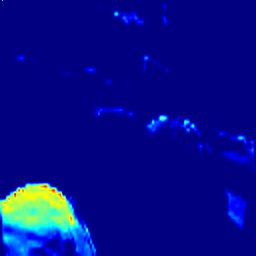

In [103]:
# visualize feature map
display(Image('weights/deep_supervision/vis_feature.png', height=256, width=256))